In [25]:
import pandas as pd
import re
import urllib

from tqdm import tqdm
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from skimage import io
import os
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('Fashion Dataset.csv' , on_bad_lines='skip')

In [3]:
data.drop(['Unnamed: 0', 'p_id', 'p_attributes'] , axis = 1 , inplace = True)

In [4]:
data.head()

,name,price,colour,brand,img,ratingCount,avg_rating,description
0,Khushal K Women Black Ethnic Motifs Printed Ku...,5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...
1,InWeave Women Orange Solid Kurta with Palazzos...,5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...
2,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...
3,Nayo Women Red Floral Printed Kurta With Trous...,3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...
4,AHIKA Women Black & Green Printed Straight Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ..."


In [5]:
data.dropna(how='all' , inplace = True)

In [6]:
data[data['colour'].isnull()]

,name,price,colour,brand,img,ratingCount,avg_rating,description
367,Baisacrafts Women Pure Cotton Kurta with Trous...,5450.0,NaN,Baisacrafts,http://assets.myntassets.com/assets/images/191...,NaN,NaN,Solid Kurta with Trousers with dupatta<br><br>...
2458,LIVE OK Women Boyfriend Fit High-Rise Stretcha...,1999.0,NaN,LIVE OK,http://assets.myntassets.com/assets/images/191...,NaN,NaN,"<ul> <li> Dark shade, no fade jeans </li> <li..."
14129,MANGO Women Hooded Sweatshirt,2390.0,NaN,MANGO,http://assets.myntassets.com/assets/images/161...,NaN,NaN,"Solid sweatshirt has a hooded, short drop shou..."


In [7]:
data.drop([367,2458,14129] , axis = 0 , inplace = True)

In [8]:
stop_words = {'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 're',
 's',
 'same',
 'shan',
 "shan't",
 'she',
 "she's",
 'should',
 "should've",
 'shouldn',
 "shouldn't",
 'so',
 'some',
 'such',
 't',
 'than',
 'that',
 "that'll",
 'the',
 'their',
 'theirs',
 'them',
 'themselves',
 'then',
 'there',
 'these',
 'they',
 'this',
 'those',
 'through',
 'to',
 'too',
 'under',
 'until',
 'up',
 've',
 'very',
 'was',
 'wasn',
 "wasn't",
 'we',
 'were',
 'weren',
 "weren't",
 'what',
 'when',
 'where',
 'which',
 'while',
 'who',
 'whom',
 'why',
 'will',
 'with',
 'won',
 "won't",
 'wouldn',
 "wouldn't",
 'y',
 'you',
 "you'd",
 "you'll",
 "you're",
 "you've",
 'your',
 'yours',
 'yourself',
 'yourselves'}

In [9]:
def preprocess(text):
    
    text =  re.sub(r'[\W]', ' ', text)  # remove special chracter
    text = re.sub(' +' , ' ' , text)
    text = text.lower()
    text = re.sub(r'\d', '', text)

    text = text.split()

    text = [word for word in text if word not in stop_words]
    text = [word for word in text if len(word)>1]
    text = ' '.join(text)
    text = text.lstrip()
    text = text.rstrip()

    return text

In [10]:
def preprocess_description(text):
    
    text = re.sub(r'<[^>]+>','',text)
    text = re.sub(r'[\W]', ' ', text)
    text = re.sub(r'\d', '', text)
    text = re.sub(r' +', ' ', text)
    text = text.lower()
    
    text = text.split()
    text = [word for word in text if word not in stop_words]
    text = [word for word in text if len(word)>1]
    text = ' '.join(text)
    text = text.lstrip()
    text = text.rstrip()
    
    
    return text

In [11]:
data['name'] = data['name'].apply(lambda x : preprocess(x))
data['description'] = data['description'].apply(lambda x : preprocess_description(x) )

data['brand'] = data['brand'].apply(lambda x : x.lower())
data['brand'] = data['brand'].apply(lambda x : re.sub(' ' , '_' , x))

data['colour'] = data['colour'].apply(lambda x : x.lower())
data['colour'] = data['colour'].apply(lambda x : re.sub(' ','_',x))

In [12]:
data['colour'].value_counts()

black                1917
blue                 1814
pink                 1179
green                1089
navy_blue             846
white                 811
red                   714
grey                  572
maroon                527
yellow                498
beige                 487
mustard               325
off_white             314
peach                 303
purple                296
orange                288
olive                 257
brown                 255
teal                  192
cream                 157
multi                 147
burgundy              146
sea_green             115
turquoise_blue        113
rust                  108
lavender              102
gold                   93
magenta                86
charcoal               84
coral                  81
fuchsia                54
mauve                  51
lime_green             50
rose                   44
grey_melange           43
khaki                  27
coffee_brown           25
taupe                  18
fluorescent_

In [13]:
data.head()

,name,price,colour,brand,img,ratingCount,avg_rating,description
0,khushal women black ethnic motifs printed kurt...,5099.0,black,khushal_k,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,black printed kurta palazzos dupatta kurta des...
1,inweave women orange solid kurta palazzos flor...,5899.0,orange,inweave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,orange solid kurta palazzos dupattakurta desig...
2,anubhutee women navy blue ethnic motifs embroi...,4899.0,navy_blue,anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,navy blue embroidered kurta trousers dupatta k...
3,nayo women red floral printed kurta trouser du...,3699.0,red,nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,red printed kurta trouser dupattakurta design ...
4,ahika women black green printed straight kurta,1350.0,black,ahika,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,black green printed straight kurta nitched rou...


# Extracting Features

#### TF-IDF Model on Title Feature

In [14]:
tfidf_title_vectorizer = TfidfVectorizer()
tfidf_title_features   = tfidf_title_vectorizer.fit_transform(data['name'])
print(tfidf_title_features.get_shape()) # number of rows and columns in feature matrix.

# for tf-idf w2v model
title_idf = dict(zip(tfidf_title_vectorizer.get_feature_names_out() , list(tfidf_title_vectorizer.idf_)))
title_tfidf_words = set(tfidf_title_vectorizer.get_feature_names_out())

(14309, 2372)


#### TF-IDF W2V Model On Title Feature

In [24]:
from numpy import asarray
# load the whole embedding into memory
embeddings_index = dict()
f = open('glove.6B.100d.txt',encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))

Loaded 400000 word vectors.


In [26]:
tfidf_title_w2v_vectors = [] # tf-idf-w2v for each sen will stored in this list

for sentence in tqdm(data['name']):
    
    tf_idf_sum = 0
    sent_vec = np.zeros(100) # we want 300d vector representation for each sentence
    
    for each_word in sentence.split():
        
        if each_word in embeddings_index.keys() and each_word in title_tfidf_words:
            # getting 100d vector
            vec = embeddings_index[each_word]
            # vocabulary[each_word] = idf of that word in corpus
            # sentence.count(word) gives tf value in essay
            tf_idf = title_idf[each_word] * (sentence.count(each_word)/len(sentence))
            sent_vec += (vec * tf_idf)
            tf_idf_sum += tf_idf
    
    if tf_idf_sum != 0:
        sent_vec = sent_vec/tf_idf_sum
    
    tfidf_title_w2v_vectors.append(sent_vec)

tfidf_title_w2v_vectors =  np.asarray(tfidf_title_w2v_vectors)

100%|█████████████████████████████████████████████████████████████████████████| 14309/14309 [00:00<00:00, 22095.07it/s]


#### TF-IDF Model on Description Feature

In [29]:
tfidf_descrption_vectorizer = TfidfVectorizer()
tfidf_descrption_features   = tfidf_descrption_vectorizer.fit_transform(data['description'])
print(tfidf_descrption_features.get_shape()) # number of rows and columns in feature matrix.

# for tf-idf w2v model
description_idf = dict(zip(tfidf_descrption_vectorizer.get_feature_names_out() , list(tfidf_descrption_vectorizer.idf_)))
description_tfidf_words = set(tfidf_descrption_vectorizer.get_feature_names_out())

(14309, 10444)


#### TF-IDF-W2V Model on Description Feature

In [30]:
tfidf_description_w2v_vectors = [] # tf-idf-w2v for each sen will stored in this list

for sentence in tqdm(data['description']):
    
    tf_idf_sum = 0
    sent_vec = np.zeros(100) # we want 300d vector representation for each sentence
    
    for each_word in sentence.split():
        
        if each_word in embeddings_index.keys() and each_word in description_tfidf_words:
            # getting 100d vector
            vec = embeddings_index[each_word]
            # vocabulary[each_word] = idf of that word in corpus
            # sentence.count(word) gives tf value in essay
            tf_idf = description_idf[each_word] * (sentence.count(each_word)/len(sentence))
            sent_vec += (vec * tf_idf)
            tf_idf_sum += tf_idf
    
    if tf_idf_sum != 0:
        sent_vec = sent_vec/tf_idf_sum
    
    tfidf_description_w2v_vectors.append(sent_vec)

tfidf_description_w2v_vectors =  np.asarray(tfidf_description_w2v_vectors)

100%|██████████████████████████████████████████████████████████████████████████| 14309/14309 [00:02<00:00, 5798.82it/s]


#### Binary BOW model Colour Feature

In [16]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(binary = True)
color_binary_feature = vectorizer.fit_transform(data['colour'])

#### Binary BOW model Brand Feature

In [17]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(binary = True)
brand_binary_feature = vectorizer.fit_transform(data['brand'])

### Create Recommendation Model

In [18]:
def create_single_feature_recommendation_model(id , feature_vector ):
    
    pairwise_dist = pairwise_distances(feature_vector,feature_vector[id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:17]
    pdists  = np.sort(pairwise_dist.flatten())[0:17]
    #print(pdists)

    df_indices = list(data.index[indices])[1:]
    df_image = data.loc[df_indices]

    image_data = []
    image_name = []
    for ele in df_image['img']:
        image_data.append(ele)

    for ele in df_image['name']:
        image_name.append(ele)


    plt.rcParams["figure.figsize"] = [5,5]
    plt.rcParams["figure.autolayout"] = True

    f = data['img'][id]
    a = io.imread(f)

    plt.imshow(a)
    plt.axis('off')
    plt.title("*****************************************************************       Name : {}       *****************************************************************".format(data['name'][id]))
    plt.show()

    print()
    print()
    print()

  
    print("======================================================= Recommendations =======================================================")

    print()
    print()
    print()

    f, axarr = plt.subplots(5,3, figsize=(30, 30))
    count = 0

    for i in range(5):
        for j in range(3):

            urllib.request.urlretrieve(image_data[count], 'a.png')
            img = Image.open("a.png")
            img.thumbnail((400, 400))
            axarr[i,j].set_title(image_name[count])
            axarr[i,j].imshow(img)
            count +=1 



In [19]:
def create_recommendation_from_same_brand(id ,title_feature_vector , brand_feature_vector ,tfidf_descrption_features ):
  
    title_pairwise_dist = pairwise_distances(title_feature_vector,title_feature_vector[id].reshape(1,-1))
    brand_pairwise_dist = pairwise_distances(brand_feature_vector,brand_feature_vector[id].reshape(1,-1))
    #color_pairwise_dist = pairwise_distances(color_feature_vector,color_feature_vector[id].reshape(1,-1))
    descrption_pairwise_dist = pairwise_distances(tfidf_descrption_features,tfidf_descrption_features[id].reshape(1,-1))


    sum_of_pairwise_distance = 0.2 * title_pairwise_dist + 0.2 * descrption_pairwise_dist + 0.6 * brand_pairwise_dist

    indices = np.argsort(sum_of_pairwise_distance.flatten())[0:17]
    pdists  = np.sort(sum_of_pairwise_distance.flatten())[0:17]
    #print(pdists)

    df_indices = list(data.index[indices])[1:]
    df_image = data.loc[df_indices]

    image_data = []
    image_name = []
    for ele in df_image['img']:
        image_data.append(ele)

    for ele in df_image['name']:
        image_name.append(ele)


    plt.rcParams["figure.figsize"] = [5,5]
    plt.rcParams["figure.autolayout"] = True

    f = data['img'][id]
    a = io.imread(f)

    plt.imshow(a)
    plt.axis('off')
    plt.title("*****************************************************************       Name : {}       *****************************************************************".format(data['name'][id]))
    plt.show()

    print()
    print()
    print()

  
    print("======================================================= Recommendations =======================================================")

    print()
    print()
    print()

    f, axarr = plt.subplots(5,3, figsize=(30, 30))
    count = 0

    for i in range(5):
        for j in range(3):

            urllib.request.urlretrieve(image_data[count], 'a.png')
            img = Image.open("a.png")
            img.thumbnail((400, 400))
            axarr[i,j].set_title(image_name[count])
            axarr[i,j].imshow(img)
            count +=1 



In [20]:
def create_recommendation_model(id , title_feature_vector , brand_feature_vector, color_feature_vector , tfidf_descrption_features ):
  
    title_pairwise_dist = pairwise_distances(title_feature_vector,title_feature_vector[id].reshape(1,-1))
    brand_pairwise_dist = pairwise_distances(brand_feature_vector,brand_feature_vector[id].reshape(1,-1))
    color_pairwise_dist = pairwise_distances(color_feature_vector,color_feature_vector[id].reshape(1,-1))
    descrption_pairwise_dist = pairwise_distances(tfidf_descrption_features,tfidf_descrption_features[id].reshape(1,-1))


    sum_of_pairwise_distance = 0.4 * title_pairwise_dist + 0.5 * descrption_pairwise_dist + 0.1 * color_pairwise_dist

    indices = np.argsort(sum_of_pairwise_distance.flatten())[0:17]
    pdists  = np.sort(sum_of_pairwise_distance.flatten())[0:17]
    #print(pdists)

    df_indices = list(data.index[indices])[1:]
    df_image = data.loc[df_indices]

    image_data = []
    image_name = []
    for ele in df_image['img']:
        image_data.append(ele)

    for ele in df_image['name']:
        image_name.append(ele)


    plt.rcParams["figure.figsize"] = [5,5]
    plt.rcParams["figure.autolayout"] = True

    f = data['img'][id]
    a = io.imread(f)

    plt.imshow(a)
    plt.axis('off')
    plt.title("*****************************************************************       Name : {}       *****************************************************************".format(data['name'][id]))
    plt.show()

    print()
    print()
    print()

  
    print("======================================================= Recommendations =======================================================")

    print()
    print()
    print()

    f, axarr = plt.subplots(5,3, figsize=(30, 30))
    count = 0

    for i in range(5):
        for j in range(3):

            urllib.request.urlretrieve(image_data[count], 'a.png')
            img = Image.open("a.png")
            img.thumbnail((400, 400))
            axarr[i,j].set_title(image_name[count])
            axarr[i,j].imshow(img)
            count +=1 



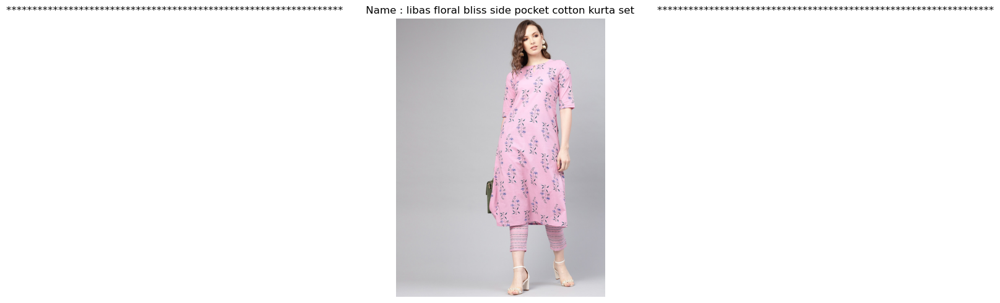




======================================================= Recommendations =======================================================





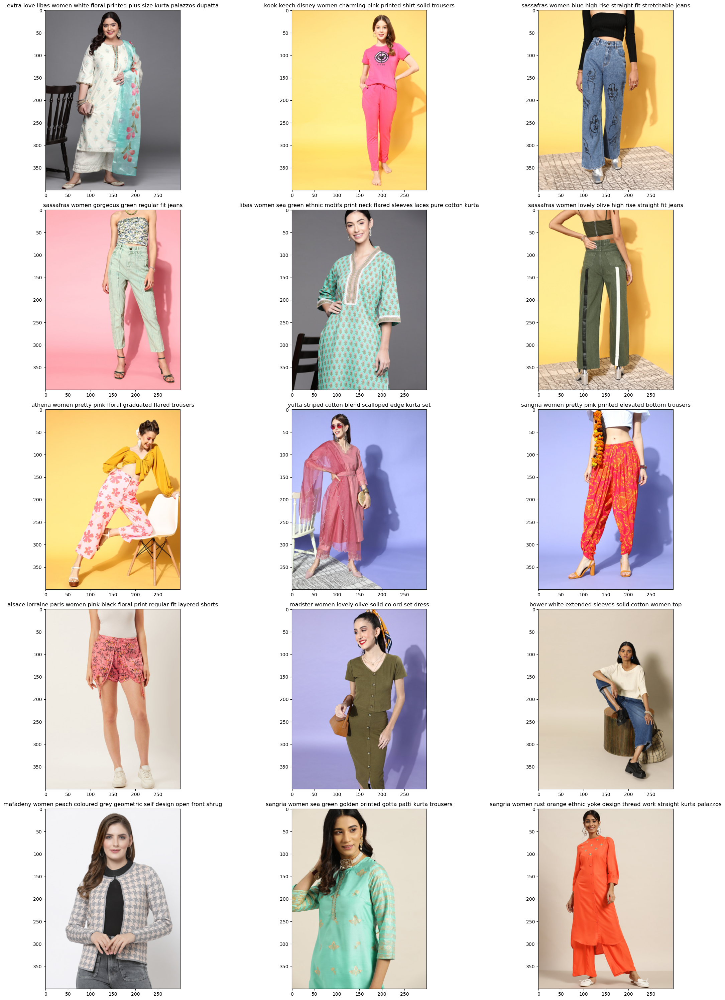

In [38]:
create_recommendation_model(10 , tfidf_title_w2v_vectors , brand_binary_feature , color_binary_feature , tfidf_description_w2v_vectors)

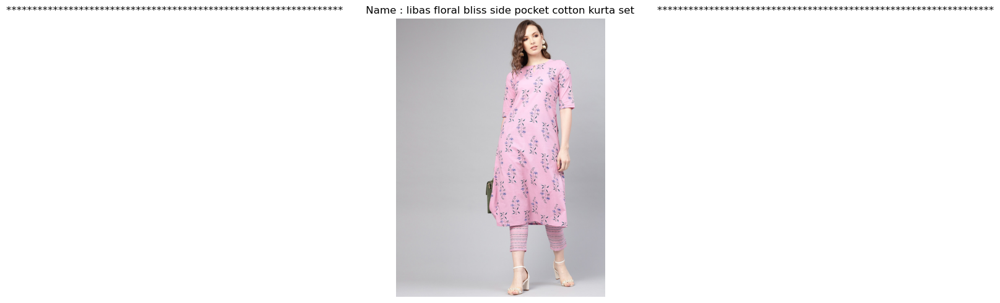




======================================================= Recommendations =======================================================





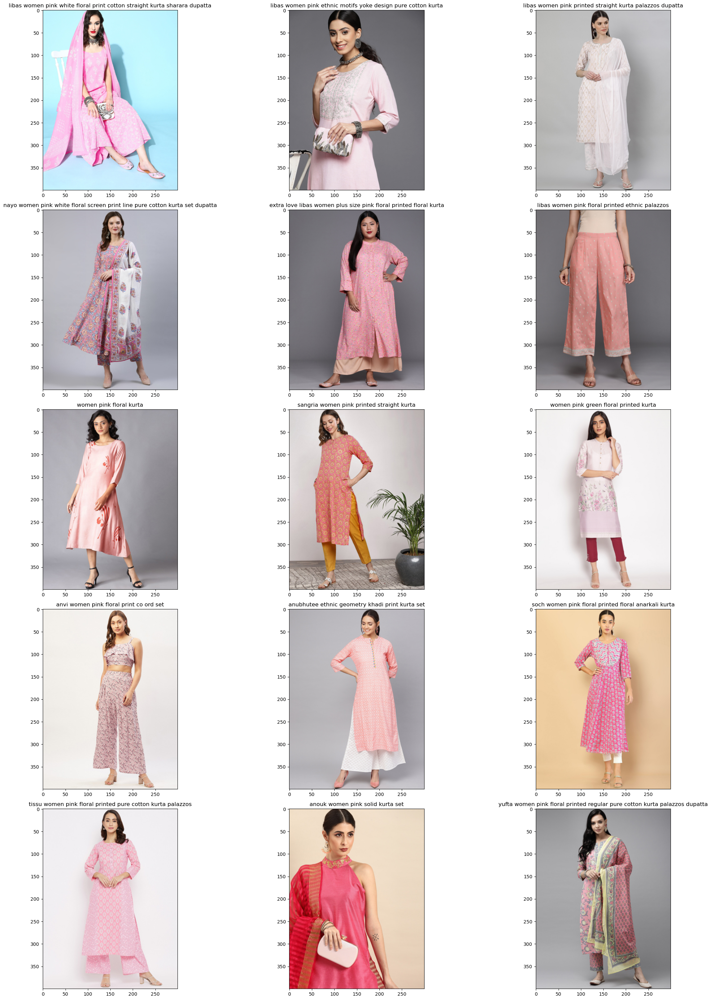

In [33]:
create_recommendation_model(10 , tfidf_title_features , brand_binary_feature , color_binary_feature , tfidf_descrption_features)

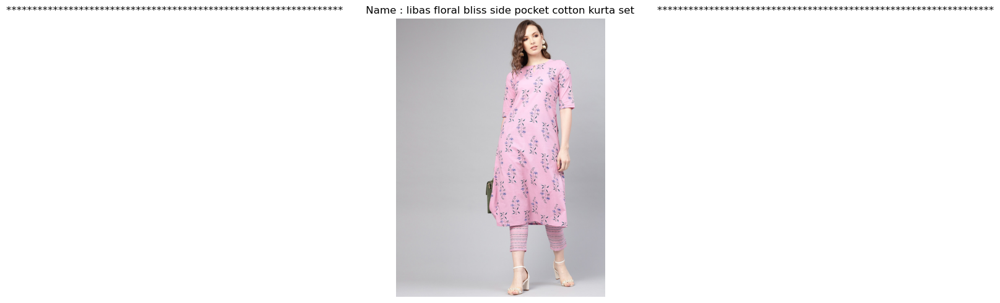




======================================================= Recommendations =======================================================





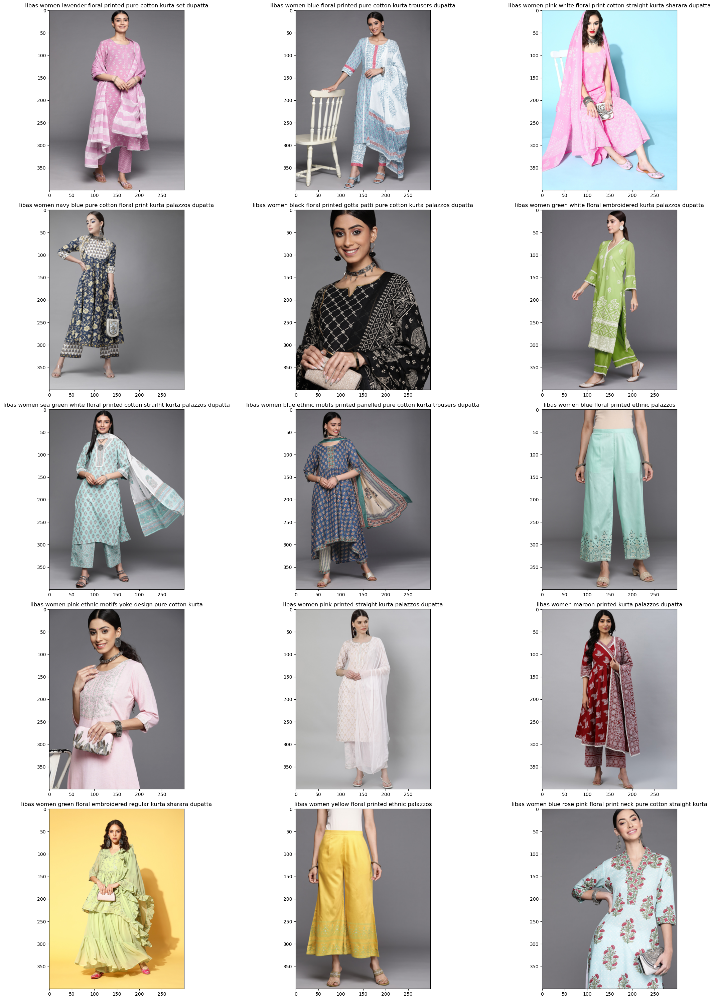

In [35]:
create_recommendation_from_same_brand(10, tfidf_title_features , brand_binary_feature ,tfidf_descrption_features )

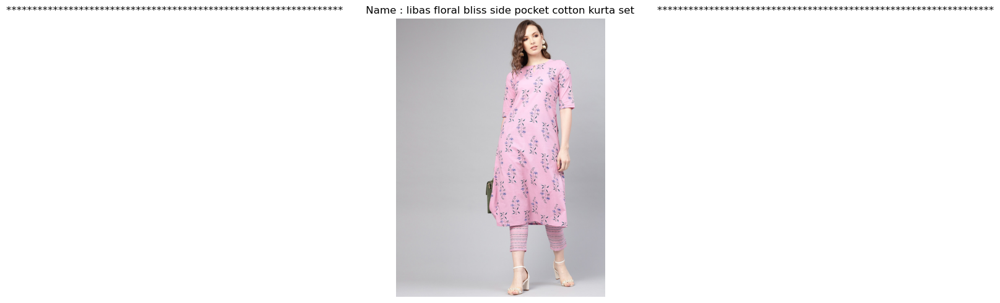




======================================================= Recommendations =======================================================





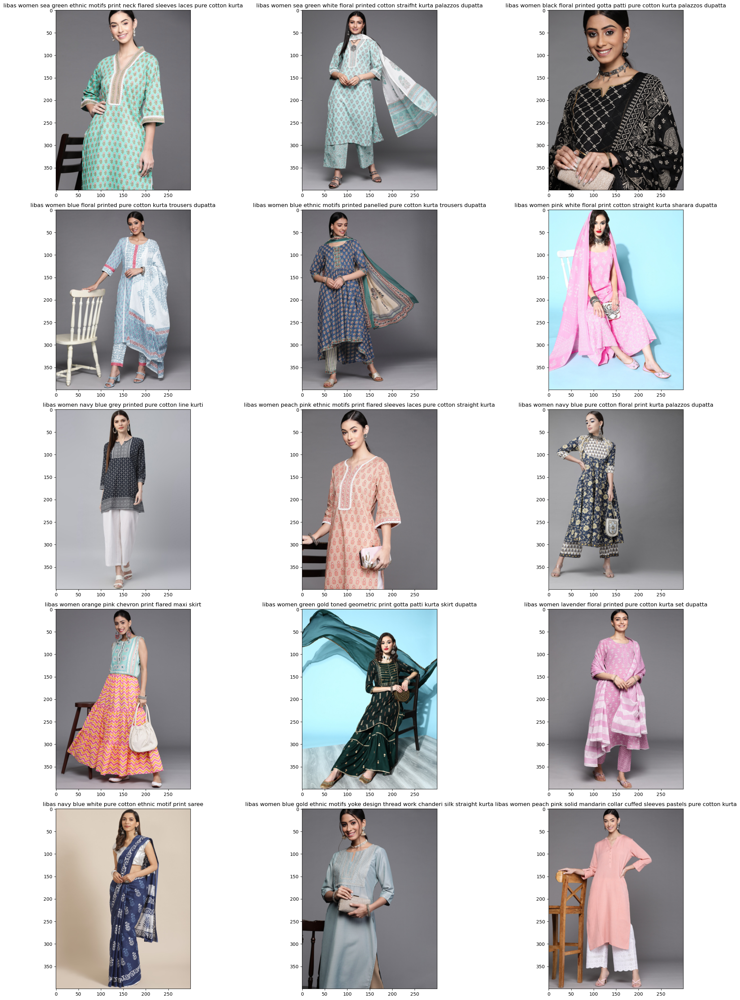

In [37]:
create_recommendation_from_same_brand(10, tfidf_title_w2v_vectors , brand_binary_feature ,tfidf_description_w2v_vectors )